In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Data Preparation

In [4]:
df = pd.read_csv('imbd_cleaned.csv')

# Mappa di raggruppamento
category_mapping = {
    'movie': 'Film',
    'tvMovie': 'Film',
    'short': 'Shorts',
    'tvShort': 'Shorts',
    'tvSeries': 'Serie TV',
    'tvMiniSeries': 'Serie TV',
    'tvEpisode': 'Serie TV',
    'tvSpecial': 'Speciale TV',
    'video': 'Video',
    'videoGame': 'Videogame'
}

# Applicare la mappa al dataframe
df['titleType'] = df['titleType'].map(category_mapping)

X = df.select_dtypes(include=['number'])

X = X.values
y = np.array(df['titleType'])

In [5]:
from sklearn.model_selection import train_test_split, cross_val_score 

from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100, stratify=y)

In [7]:
from sklearn.preprocessing import StandardScaler

In [8]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [9]:
# creates validation set
X_val, X_new_test, y_val, y_new_test = train_test_split(X_test, y_test, test_size=0.2, random_state=42, stratify=y_test)

In [10]:
from sklearn.preprocessing import LabelEncoder

# Se non l'hai già fatto
le = LabelEncoder() 
y_train = le.fit_transform(y_train) 
y_test = le.transform(y_test) 

In [11]:
y_val = le.transform(y_val)  # anche il validation set se serve
y_new_test = le.transform(y_new_test)

# Sklearn Multilayer Perceptron

In [ ]:
from sklearn.neural_network import MLPClassifier

In [ ]:
hidden_layer_sizes = (100, 200,)

In [ ]:
clf = MLPClassifier(random_state=0)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

In [ ]:
mlpparameters = clf.get_params()
layers = clf.hidden_layer_sizes
print(layers)
print(mlpparameters)

In [ ]:
plt.plot(clf.loss_curve_)
plt.show()

In [ ]:
clf = MLPClassifier(hidden_layer_sizes=(128, 64, 32,), alpha=0.1,
                    learning_rate='adaptive',
                    activation='tanh', early_stopping=False,
                    momentum=0.9, random_state=0, max_iter=500)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

In [ ]:
plt.plot(clf.loss_curve_)
plt.show()

In [ ]:
clf = MLPClassifier(hidden_layer_sizes=(128, 64, 32,), alpha=0.1, learning_rate='adaptive',
                    activation='tanh', early_stopping=True, momentum=0.9, random_state=0)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

In [ ]:
plt.plot(clf.loss_curve_)
plt.show()

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_list = {
    'hidden_layer_sizes': [(256, 128, 64,), (128, 64, 32,), (64, 32,)],
    'alpha': [0.1, 0.01, 0.001],
    'activation': ['tanh', 'relu', 'logistic'],
    'solver': ['sgd', 'adam'],
    'early_stopping': [True, False]
}

In [ ]:
random_search = RandomizedSearchCV(
    MLPClassifier(random_state=0, max_iter=1000),
    param_distributions=param_list,
    n_jobs=-1,
    refit=True,
    verbose=2
)

In [ ]:
random_search.fit(X_train, y_train)

In [ ]:
print(random_search.best_params_, random_search.best_score_)

In [ ]:
#FAI PRIMA LABEL ENCODER
# Crea il modello SVM con kernel RBF e i parametri forniti
model = MLPClassifier(solver='adam', alpha=0.01, hidden_layer_sizes=(256, 128, 64), activation='relu',
                      early_stopping=True, random_state=0, max_iter=1000)

# Addestra il modello
model.fit(X_train, y_train)

# Fai previsioni
y_pred = model.predict(X_test)

# Stampa i risultati
print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

In [ ]:
y_prob = model.predict_proba(X_test)

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize

# Classi uniche nel dataset
classes = np.unique(y_test)

# Binarizza y_val
y_test_binarized = label_binarize(y_test, classes=classes)

y_test_binarized
plt.figure(figsize=(10, 8))

for i, class_label in enumerate(le.classes_):
    # ROC curve per la classe i
    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_prob[:, i])
    auc = roc_auc_score(y_test_binarized[:, i], y_prob[:, i])
    
    # Traccia la curva ROC
    plt.plot(fpr, tpr, label=f"Class {class_label} (AUC = {auc:.2f})")

# Linea casuale per riferimento
plt.plot([0, 1], [0, 1], 'k--', label="Random Guessing")

# Personalizza il grafico
plt.xlabel("False Positive Rate", fontsize=16)
plt.ylabel("True Positive Rate", fontsize=16)
plt.title("ROC Curve (One-vs-Rest)", fontsize=16)
plt.legend(loc="best")
plt.grid()
plt.show()
# AUC (AREA UNDER THE CURVE, Ti dice quanto bene il modello riesce a distinguere tra le classi.) 
# media di tutte le classi (le singole sono gia nel grafico)
roc_auc_score(y_test_binarized, y_prob, multi_class="ovr", average="macro")
from sklearn.metrics import precision_recall_curve, average_precision_score

plt.figure(figsize=(10, 8))

for i, class_label in enumerate(le.classes_):
    # Precision-Recall curve per la classe i
    precision, recall, _ = precision_recall_curve(y_test_binarized[:, i], y_prob[:, i])
    ap = average_precision_score(y_test_binarized[:, i], y_prob[:, i])
    
    # Traccia la curva Precision-Recall
    plt.plot(recall, precision, label=f"Class {class_label} (AP = {ap:.2f})")

# Personalizza il grafico
plt.xlabel("Recall", fontsize=16)
plt.ylabel("Precision", fontsize=16)
plt.title("Precision-Recall Curve (One-vs-Rest)", fontsize=16)
plt.legend(loc="best")
plt.grid()
plt.show()

### FAI LA ROC

In [ ]:
y_pred = random_search.predict(X_test).astype(int)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

# PyTorch

In [ ]:
# !pip3 install torch
# !pip install torchsummary
# !pip install pytorch-ignite

In [12]:
import torch
import torch.nn as nn
import torch.optim as optim

from torchsummary import summary
from torch.utils.data import TensorDataset, DataLoader

from ignite.metrics import Accuracy, Loss
from ignite.engine import Engine, Events, create_supervised_trainer, create_supervised_evaluator

In [ ]:
# a = np.unique(y_train)
# a

In [13]:
# numpy to tensor
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)

X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)

X_test_tensor = torch.tensor(X_new_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_new_test, dtype=torch.long)

In [14]:
# creates tensor dataset (can be later loaded)
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

In [15]:
# creates data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=32)
test_loader = DataLoader(test_dataset, batch_size=32)

In [16]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [ ]:
class CustomModel(nn.Module):
    def __init__(self, input_size, hidden_size1, hidden_size2, output_size):
        super(CustomModel, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size1)
        self.fc2 = nn.Linear(hidden_size1, hidden_size2)
        self.fc3 = nn.Linear(hidden_size2, output_size)
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.softmax(self.fc3(x))
        return x

In [ ]:
# define hyperparameters
n_classes = len(np.unique(y_train))
input_size = X_train.shape[1]
hidden_size1 = 128
hidden_size2 = 64
output_size = n_classes

In [ ]:
# instanciates model
model = CustomModel(input_size, hidden_size1, hidden_size2, output_size)

In [ ]:
summary(model, input_size=(input_size,))

In [ ]:
# optimizer and loss function
optimizer = optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

In [ ]:
# ignite trainer
trainer = create_supervised_trainer(model, optimizer, criterion, device)

# validation metrics are ignite metrics
val_metrics = {"accuracy": Accuracy(), "loss": Loss(criterion)}

# ignite train and validation evaluators
train_evaluator = create_supervised_evaluator(model, metrics=val_metrics, device=device)
val_evaluator = create_supervised_evaluator(model, metrics=val_metrics, device=device)

training_history = {'accuracy':[],'loss':[]}
validation_history = {'accuracy':[],'loss':[]}

In [ ]:
# For logging purposes we add a function to be executed at the end of every log_interval-th iteration:
log_interval = 100

@trainer.on(Events.ITERATION_COMPLETED(every=log_interval))
def log_training_loss(engine):
    print(f"Epoch[{engine.state.epoch}], Iter[{engine.state.iteration}] Loss: {engine.state.output:.2f}")

# after a training epoch, computes training and validation metrics (train_eval on train_loader and val_eval on val_loader)
@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(trainer):
    train_evaluator.run(train_loader)
    metrics = train_evaluator.state.metrics
    training_history['accuracy'].append(metrics['accuracy']*100)
    training_history['loss'].append(metrics['loss'])
    print(f"Training Results - Epoch[{trainer.state.epoch}] Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['loss']:.2f}")

@trainer.on(Events.EPOCH_COMPLETED)
def log_validation_results(trainer):
    val_evaluator.run(val_loader)
    metrics = val_evaluator.state.metrics
    validation_history['accuracy'].append(metrics['accuracy']*100)
    validation_history['loss'].append(metrics['loss'])
    print(f"Validation Results - Epoch[{trainer.state.epoch}] Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['loss']:.2f}")

In [ ]:
trainer.run(train_loader, max_epochs=300)

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 3))
axes[0].plot(training_history['accuracy'], label='train')
axes[0].plot(validation_history['accuracy'], label='val')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(training_history['loss'], label='train')
axes[1].plot(validation_history['loss'], label='val')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Loss')
axes[1].legend()
fig.tight_layout()

plt.show()

### Early Stopping

In [ ]:
# model + optimizer + criterion
model = CustomModel(input_size, hidden_size1, hidden_size2, output_size)
optimizer = optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

# ignite trainer + evaluators
trainer = create_supervised_trainer(model, optimizer, criterion, device)
val_metrics = {"accuracy": Accuracy(), "loss": Loss(criterion)}
train_evaluator = create_supervised_evaluator(model, metrics=val_metrics, device=device)
val_evaluator = create_supervised_evaluator(model, metrics=val_metrics, device=device)

training_history = {'accuracy':[],'loss':[]}
validation_history = {'accuracy':[],'loss':[]}

# loggers + history appends
@trainer.on(Events.ITERATION_COMPLETED(every=log_interval))
def log_training_loss(engine):
    print(f"Epoch[{engine.state.epoch}], Iter[{engine.state.iteration}] Loss: {engine.state.output:.2f}")

# after a training epoch, computes training and validation metrics (train_eval on train_loader and val_eval on val_loader)
@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(trainer):
    train_evaluator.run(train_loader)
    metrics = train_evaluator.state.metrics
    training_history['accuracy'].append(metrics['accuracy']*100)
    training_history['loss'].append(metrics['loss'])
    print(f"Training Results - Epoch[{trainer.state.epoch}] Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['loss']:.2f}")

@trainer.on(Events.EPOCH_COMPLETED)
def log_validation_results(trainer):
    val_evaluator.run(val_loader)
    metrics = val_evaluator.state.metrics
    validation_history['accuracy'].append(metrics['accuracy']*100)
    validation_history['loss'].append(metrics['loss'])
    print(f"Validation Results - Epoch[{trainer.state.epoch}] Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['loss']:.2f}")

In [ ]:
from ignite.handlers import EarlyStopping, ModelCheckpoint
from ignite.contrib.handlers import global_step_from_engine

# return current value of any metric defined in val_metrics
def score_function(engine):
    return engine.state.metrics["accuracy"]

# define early stopping and model checkpoint
handler = EarlyStopping(patience=50, score_function=score_function, trainer=trainer)

checkpoint = ModelCheckpoint(
    dirname='models',
    filename_prefix='best_NOREG',
    n_saved=1,
    create_dir=True,
    global_step_transform=global_step_from_engine(trainer) # helps fetch the trainer's state
)

# Attach early stopping and model checkpoint to the trainer
val_evaluator.add_event_handler(Events.EPOCH_COMPLETED, handler)
val_evaluator.add_event_handler(Events.EPOCH_COMPLETED, checkpoint, {'model': model})

In [ ]:
trainer.run(train_loader, max_epochs=300)

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 3))
axes[0].plot(training_history['accuracy'], label='train')
axes[0].plot(validation_history['accuracy'], label='val')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(training_history['loss'], label='train')
axes[1].plot(validation_history['loss'], label='val')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Loss')
axes[1].legend()
fig.tight_layout()

plt.show()

a gigi piace il pisello grande grande

### GRIDSEARCH

In [ ]:
from ignite.handlers import EarlyStopping, ModelCheckpoint
from ignite.contrib.handlers import global_step_from_engine

In [ ]:
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.model_selection import RandomizedSearchCV
from ignite.engine import State

In [ ]:
class PyTorchModel(nn.Module):
    def __init__(self, input_dim, hidden_layer_sizes, activation):
        super(PyTorchModel, self).__init__()
        layers = []
        prev_size = input_dim
        
        # create linear layers with specified hidden layer sizes
        for size in hidden_layer_sizes:
            layers.append(nn.Linear(prev_size, size))
            layers.append(activation)
            prev_size = size
        
        # final output layer
        layers.append(nn.Linear(prev_size, n_classes))
        
        # sequentially stack all layers
        self.layers = nn.Sequential(*layers)

    def forward(self, x):
        # pass input through all layers and apply softmax activation
        return torch.softmax(self.layers(x), dim=-1)

In [ ]:
class PyTorchClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, input_dim, hidden_layer_sizes, activation, optimizer_class, lr, epochs,
                 device, criterion, batch_size, patience=50):
        self.input_dim = input_dim
        self.hidden_layer_sizes = hidden_layer_sizes
        self.activation = activation
        self.optimizer_class = optimizer_class
        self.lr = lr
        self.epochs = epochs
        self.model = None
        self.optimizer = None
        self.device = device
        self.criterion = criterion
        self.batch_size = batch_size
        self.patience = patience
        self.trainer = None

    def fit(self, X, y):
        print("=======================================================")
        print("Fitting on Parameters:", 
          f"Input Dimension: {self.input_dim},\n"
          f"Hidden Layer Sizes: {self.hidden_layer_sizes},\n"
          f"Activation: {self.activation},\n"
          f"Optimizer Class: {self.optimizer_class},\n"
          f"Learning Rate: {self.lr},\n"
          f"Epochs: {self.epochs},\n"
          f"Device: {self.device},\n"
          f"Criterion: {self.criterion},\n"
          f"Batch Size: {self.batch_size},\n"
          f"Patience: {self.patience}\n"
        )

        self.classes_ = np.unique(y)

        # Initialize model and optimizer
        self.model = PyTorchModel(self.input_dim, self.hidden_layer_sizes, self.activation)
        self.optimizer = self.optimizer_class(self.model.parameters(), lr=self.lr)

    # DataLoader
        tensor_dataset = TensorDataset(torch.tensor(X, dtype=torch.float32), torch.tensor(y, dtype=torch.long))
        self.train_loader = DataLoader(tensor_dataset, batch_size=self.batch_size, shuffle=False)

    # Ignite Trainer
        self.trainer = create_supervised_trainer(self.model, self.optimizer, self.criterion, self.device)

    # Evaluator per loss media (usata per early stopping)
        self.evaluator = create_supervised_evaluator(
           self.model,
            metrics={'loss': Loss(self.criterion)},
            device=self.device
        )

    # Logger durante il training
        self.trainer.add_event_handler(Events.EPOCH_COMPLETED, self.log_training_results)

        @self.trainer.on(Events.ITERATION_COMPLETED(every=10))
        def log_training_loss(engine):
            print(f"Epoch[{engine.state.epoch}], Iter[{engine.state.iteration}] Loss: {engine.state.output:.4f}")

    # Early stopping: calcolato sulla loss media dell'epoca
        def score_function(engine):
            val_loss = engine.state.metrics['loss']
            return -val_loss  # vogliamo minimizzare la loss

    # Dopo ogni epoca, valuta su tutto il training set (potresti cambiarlo con validation se ne hai uno)
        @self.trainer.on(Events.EPOCH_COMPLETED)
        def run_validation_and_early_stopping(engine):
            self.evaluator.run(self.train_loader)

        early_stopping = EarlyStopping(
            patience=self.patience,
            score_function=score_function,
            trainer=self.trainer,
            min_delta=0.001  # miglioramento minimo considerato valido (opzionale)
        )
        self.evaluator.add_event_handler(Events.COMPLETED, early_stopping)

        # ✅ Salva il numero di epoche effettivamente raggiunto
        @self.trainer.on(Events.COMPLETED)
        def save_final_epoch(engine):
            self.final_epoch_ = engine.state.epoch

    # Reset stato trainer per garantire multi-fit con sklearn
        self.trainer.state = State()
        self.trainer.run(self.train_loader, max_epochs=self.epochs)

    def predict(self, X):
        self.model.eval()
        data_loader = DataLoader(TensorDataset(torch.tensor(X, dtype=torch.float32)),
                                 batch_size=self.batch_size, shuffle=False)

        predictions = []
        with torch.no_grad():
            for inputs in data_loader:
                outputs = self.model(inputs[0].to(self.device))
                _, predicted = torch.max(outputs, 1)
                predictions.extend(predicted.cpu().tolist())

        return np.array(predictions)

    def log_training_results(self, trainer):
        self.model.eval()
        total_loss = 0.0
        correct = 0
        total = 0

        with torch.no_grad():
            for inputs, targets in self.train_loader:
                inputs, targets = inputs.to(self.device), targets.to(self.device)
                outputs = self.model(inputs)
                loss = self.criterion(outputs, targets)
                total_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                total += targets.size(0)
                correct += (predicted == targets).sum().item()

        accuracy = 100 * correct / total
        avg_loss = total_loss / len(self.train_loader)
        print(f"Training Results - Epoch[{trainer.state.epoch}] Accuracy: {accuracy:.2f}% - Loss: {avg_loss:.4f}")

    def score(self, X, y):
        y_pred = self.predict(X)
        return (y_pred == y).mean()
    
    def predict_proba(self, X):
        self.model.eval()
        data_loader = DataLoader(TensorDataset(torch.tensor(X, dtype=torch.float32)),
                             batch_size=self.batch_size, shuffle=False)

        probas = []
        with torch.no_grad():
            for inputs in data_loader:
                outputs = self.model(inputs[0].to(self.device))  # già softmax
                probas.extend(outputs.cpu().numpy())

        return np.array(probas)


In [ ]:
param_grid = {
    'hidden_layer_sizes': [(128, 64, 32), (64, 32, 16), (256, 128, 64), (64, 32), (128, 64, 32, 16), (32, 64, 32), (32, 64, 128, 64, 32)],
    'activation': [nn.ReLU(), nn.Tanh()],
    'lr': [0.001, 0.01, 0.1, 1],
    'optimizer_class': [optim.Adam],
    # 'epochs': [10, 50, 100, 200],
    'batch_size': [32, 64, 128, 256]
}

In [ ]:
clf = PyTorchClassifier(
    input_dim = input_size,
    hidden_layer_sizes = (128, 64),
    activation = nn.ReLU(),
    optimizer_class = optim.Adam,
    lr = 0.001,
    epochs = 300,
    device = device,
    # metrics = {"accuracy": Accuracy(), "loss": Loss(criterion)},
    criterion = nn.CrossEntropyLoss(),
    batch_size = 32,
    patience=20
)

In [ ]:
# perform randomized grid search
rs = RandomizedSearchCV(clf, param_grid, scoring='accuracy', verbose=True, n_iter=15, cv=3, error_score='raise', random_state=42)
rs.fit(X_train, y_train)

best_model = rs.best_estimator_

print(f"Epoche effettive trovate con early stopping: {best_model.final_epoch_}")


# Prendi i migliori parametri
best_params = rs.best_params_

# Aggiungi manualmente i parametri mancanti
best_params["input_dim"] = X_train.shape[1]
best_params["device"] = "cuda" if torch.cuda.is_available() else "cpu"
best_params["criterion"] = torch.nn.CrossEntropyLoss()

# Aggiorna il numero di epoche con quello trovato da early stopping
best_params["epochs"] = best_model.final_epoch_

# Ricrea il modello finale
final_model = PyTorchClassifier(**best_params)

# Fit completo
final_model.fit(X_train, y_train)


In [ ]:
print(rs.best_score_, rs.best_params_)

In [ ]:
final_model

In [ ]:
y_test = le.transform(y_test)  # anche il test set se serve

In [ ]:
# cambia il giusto numero di epochs cercandolo a mano tra i tre fold del modello migliore
best_params["epochs"] = 90

# Ricrea il modello finale
final_model = PyTorchClassifier(**best_params)

# Fit completo
final_model.fit(X_train, y_train)

In [ ]:
y_pred = final_model.predict(X_test).astype(int)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

In [ ]:
final_model

### FAI LA ROC E LE CURVE DI ACCURACY 

In [ ]:
y_prob = final_model.predict_proba(X_test)

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize

# Classi uniche nel dataset
classes = np.unique(y_test)

# Binarizza y_val
y_test_binarized = label_binarize(y_test, classes=classes)

y_test_binarized

In [ ]:
plt.figure(figsize=(10, 8))

for i, class_label in enumerate(le.classes_):
    # ROC curve per la classe i
    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_prob[:, i])
    auc = roc_auc_score(y_test_binarized[:, i], y_prob[:, i])
    
    # Traccia la curva ROC
    plt.plot(fpr, tpr, label=f"Class {class_label} (AUC = {auc:.2f})")

# Linea casuale per riferimento
plt.plot([0, 1], [0, 1], 'k--', label="Random Guessing")

# Personalizza il grafico
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (One-vs-Rest)")
plt.legend(loc="best")
plt.grid()
plt.show()

In [ ]:
# AUC (AREA UNDER THE CURVE, Ti dice quanto bene il modello riesce a distinguere tra le classi.) 
# media di tutte le classi (le singole sono gia nel grafico)
roc_auc_score(y_test_binarized, y_prob, multi_class="ovr", average="macro")

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score

plt.figure(figsize=(10, 8))

for i, class_label in enumerate(le.classes_):
    # Precision-Recall curve per la classe i
    precision, recall, _ = precision_recall_curve(y_test_binarized[:, i], y_prob[:, i])
    ap = average_precision_score(y_test_binarized[:, i], y_prob[:, i])
    
    # Traccia la curva Precision-Recall
    plt.plot(recall, precision, label=f"Class {class_label} (AP = {ap:.2f})")

# Personalizza il grafico
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve (One-vs-Rest)")
plt.legend(loc="best")
plt.grid()
plt.show()

# Esperimenti Lorenzo su vari tipi di Neural Network con Pytorch

#### Ricordati sempre di mandare i tensori prima di partire con il codice di questi Neural Networks (ovviamente anche di runnare il codice fino al Label-Encoding)

https://chatgpt.com/share/6810b088-189c-8009-9955-e2dc038541a0

Per l'MLP Classico meglio usare la funzione di scikit-learn gia predefinita.

## MLP Profondo

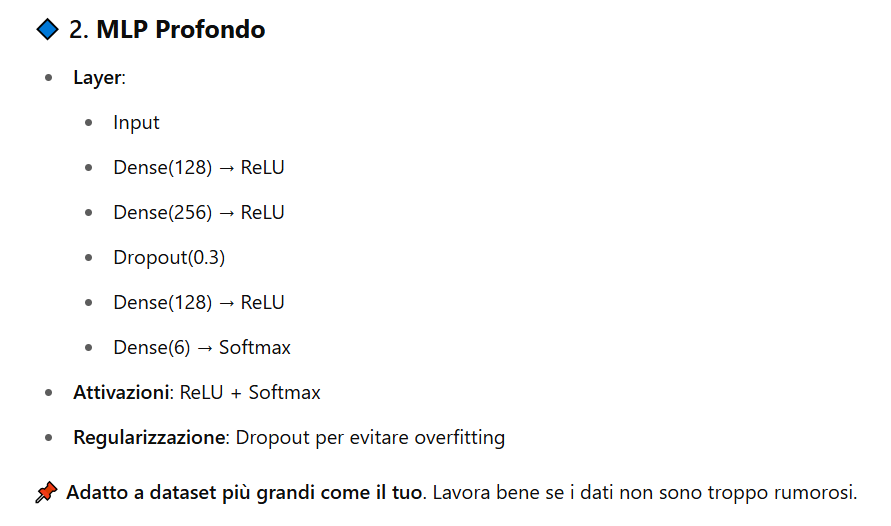

In [17]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class MLPProfondo(nn.Module):
    def __init__(self, input_dim=21, output_dim=6):
        super(MLPProfondo, self).__init__()
        
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 256)
        self.dropout = nn.Dropout(0.3)
        self.fc3 = nn.Linear(256, 128)
        self.out = nn.Linear(128, output_dim)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.dropout(x)
        x = F.relu(self.fc3(x))
        x = self.out(x)  # No softmax, lo gestisce CrossEntropyLoss
        return x

# Esempio d'uso
model = MLPProfondo()

# Loss e ottimizzatore
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Visualizzazione struttura
print(model)



MLPProfondo(
  (fc1): Linear(in_features=21, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=256, bias=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc3): Linear(in_features=256, out_features=128, bias=True)
  (out): Linear(in_features=128, out_features=6, bias=True)
)


In [18]:
# ignite trainer
trainer = create_supervised_trainer(model, optimizer, criterion)

# validation metrics are ignite metrics
val_metrics = {"accuracy": Accuracy(), "loss": Loss(criterion)}

# ignite train and validation evaluators
train_evaluator = create_supervised_evaluator(model, metrics=val_metrics)
val_evaluator = create_supervised_evaluator(model, metrics=val_metrics)


training_history = {'accuracy':[],'loss':[]}
validation_history = {'accuracy':[],'loss':[]}

In [19]:
# QUESTO è DA MANDARE QUANDO SI LANCIA IL MODELLO CON TRAINV
log_interval = 100

@trainer.on(Events.ITERATION_COMPLETED(every=log_interval))
def log_training_loss(engine):
    print(f"Epoch[{engine.state.epoch}], Iter[{engine.state.iteration}] Loss: {engine.state.output:.2f}")

@val_evaluator.on(Events.ITERATION_COMPLETED)
def debug_output_target(engine):
    output, target = engine.state.output
    print("OUTPUT SHAPE:", output.shape)   # Formato atteso: [batch_size, 6]
    print("TARGET SHAPE:", target.shape)   # Formato atteso: [batch_size]
    print("TARGET DTYPE:", target.dtype)   # Dovrebbe essere torch.int64 (long)

# after a training epoch, computes training and validation metrics (train_eval on train_loader and val_eval on val_loader)
@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(trainer):
    train_evaluator.run(train_loader)
    metrics = train_evaluator.state.metrics
    training_history['accuracy'].append(metrics['accuracy']*100)
    training_history['loss'].append(metrics['loss'])
    print(f"Training Results - Epoch[{trainer.state.epoch}] Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['loss']:.2f}")

@trainer.on(Events.EPOCH_COMPLETED)
def log_validation_results(trainer):
    val_evaluator.run(val_loader)
    metrics = val_evaluator.state.metrics
    validation_history['accuracy'].append(metrics['accuracy']*100)
    validation_history['loss'].append(metrics['loss'])
    print(f"Validation Results - Epoch[{trainer.state.epoch}] Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['loss']:.2f}")

In [20]:
from ignite.handlers import EarlyStopping, ModelCheckpoint
from ignite.contrib.handlers import global_step_from_engine

# return current value of any metric defined in val_metrics
def score_function(engine):
    return engine.state.metrics["accuracy"]

# define early stopping and model checkpoint
handler = EarlyStopping(patience=50, score_function=score_function, trainer=trainer)

checkpoint = ModelCheckpoint(
    dirname='models',
    filename_prefix='best_NOREG',
    n_saved=1,
    create_dir=True,
    global_step_transform=global_step_from_engine(trainer), # helps fetch the trainer's state
    require_empty=False
)

# Attach early stopping and model checkpoint to the trainer
val_evaluator.add_event_handler(Events.EPOCH_COMPLETED, handler)
val_evaluator.add_event_handler(Events.EPOCH_COMPLETED, checkpoint, {'model': model})

In [21]:
trainer.run(train_loader, max_epochs=30)

Epoch[1], Iter[100] Loss: 1.18
Epoch[1], Iter[200] Loss: 0.58
Epoch[1], Iter[300] Loss: 0.39
Epoch[1], Iter[400] Loss: 0.31
Epoch[1], Iter[500] Loss: 0.61
Epoch[1], Iter[600] Loss: 0.27
Epoch[1], Iter[700] Loss: 0.55
Epoch[1], Iter[800] Loss: 0.28
Epoch[1], Iter[900] Loss: 0.57
Epoch[1], Iter[1000] Loss: 0.23
Epoch[1], Iter[1100] Loss: 0.23
Epoch[1], Iter[1200] Loss: 0.36
Epoch[1], Iter[1300] Loss: 0.31
Epoch[1], Iter[1400] Loss: 0.28
Epoch[1], Iter[1500] Loss: 0.27
Epoch[1], Iter[1600] Loss: 0.33
Epoch[1], Iter[1700] Loss: 0.25
Epoch[1], Iter[1800] Loss: 0.32
Epoch[1], Iter[1900] Loss: 0.16
Epoch[1], Iter[2000] Loss: 0.09
Epoch[1], Iter[2100] Loss: 0.38
Epoch[1], Iter[2200] Loss: 0.26
Epoch[1], Iter[2300] Loss: 0.21
Epoch[1], Iter[2400] Loss: 0.43
Epoch[1], Iter[2500] Loss: 0.19
Epoch[1], Iter[2600] Loss: 0.26
Epoch[1], Iter[2700] Loss: 0.23
Epoch[1], Iter[2800] Loss: 0.37
Epoch[1], Iter[2900] Loss: 0.35
Epoch[1], Iter[3000] Loss: 0.33
Epoch[1], Iter[3100] Loss: 0.11
Epoch[1], Iter[32

State:
	iteration: 97560
	epoch: 30
	epoch_length: 3252
	max_epochs: 30
	output: 0.00042685389053076506
	batch: <class 'list'>
	metrics: <class 'dict'>
	dataloader: <class 'torch.utils.data.dataloader.DataLoader'>
	seed: <class 'NoneType'>
	times: <class 'dict'>

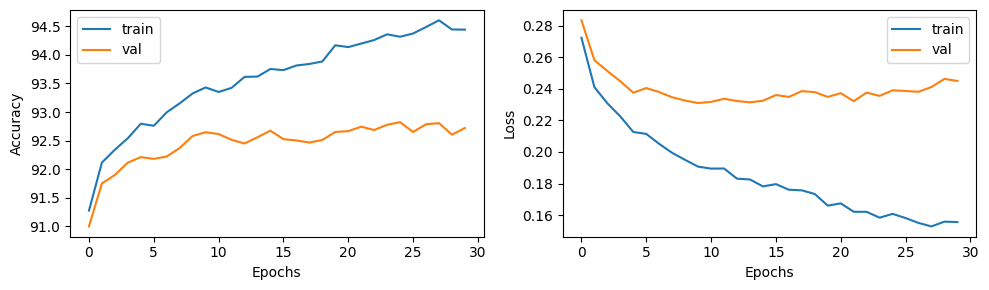

In [22]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 3))
axes[0].plot(training_history['accuracy'], label='train')
axes[0].plot(validation_history['accuracy'], label='val')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(training_history['loss'], label='train')
axes[1].plot(validation_history['loss'], label='val')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Loss')
axes[1].legend()
fig.tight_layout()

plt.show()

In [23]:
# IL NUMERO VA CAMBIATO OGNI VOLTA CHE CAMBIA IL MODELLO
model.load_state_dict(torch.load('models/best_NOREG_model_30.pt'))

<All keys matched successfully>

In [24]:
# Valutazione sul test set + estrazione delle predizioni
from ignite.engine import create_supervised_evaluator
from ignite.metrics import Accuracy, Loss

# Metriche su test set
test_metrics = {"accuracy": Accuracy(), "loss": Loss(criterion)}
test_evaluator = create_supervised_evaluator(model, metrics=test_metrics)

test_evaluator.run(test_loader)
metrics = test_evaluator.state.metrics
print(f"Test Results - Accuracy: {metrics['accuracy']:.4f}, Loss: {metrics['loss']:.4f}")

# Estrazione predizioni e target
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for xb, yb in test_loader:
        outputs = model(xb)
        preds = torch.argmax(outputs, dim=1)
        y_true.extend(yb.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())


Test Results - Accuracy: 0.9241, Loss: 0.2380


In [25]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc, precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import label_binarize

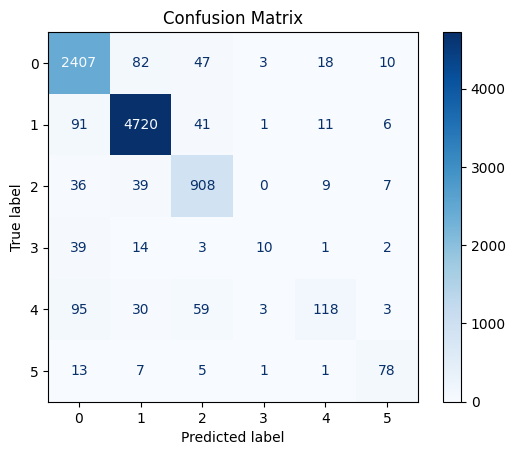

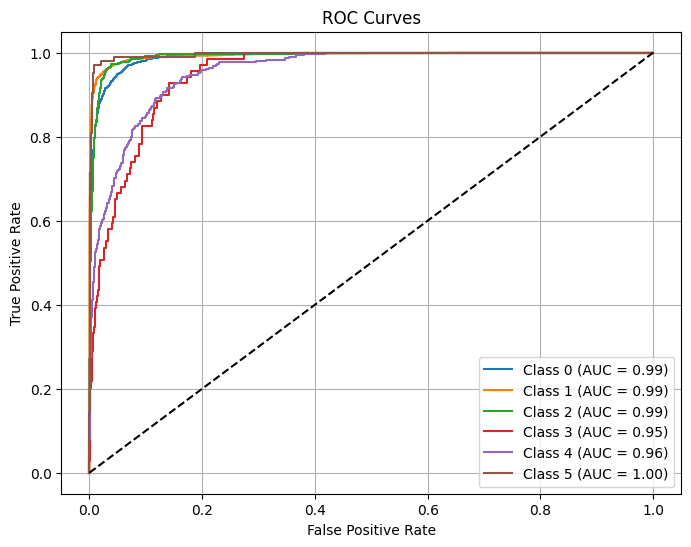

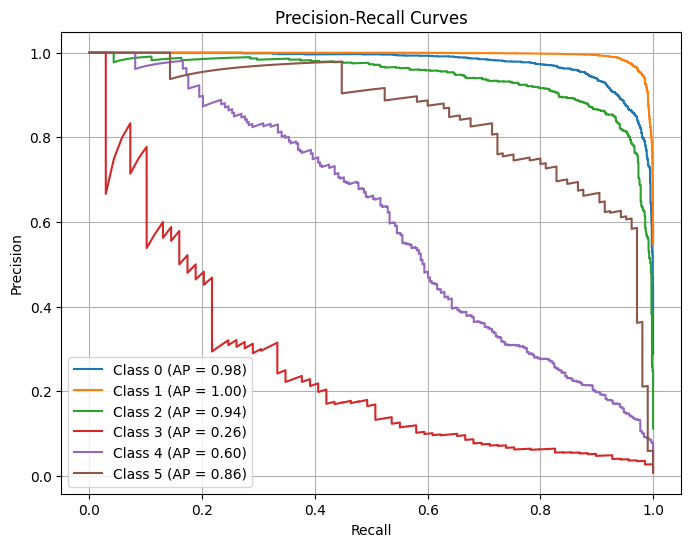

In [26]:
# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

# Binarizzazione per ROC e PR curve
n_classes = len(np.unique(y_true))
y_true_bin = label_binarize(y_true, classes=list(range(n_classes)))

# Ottieni probabilità predette
model.eval()
y_scores = []

with torch.no_grad():
    for xb, _ in test_loader:
        outputs = model(xb)
        probs = torch.softmax(outputs, dim=1)
        y_scores.extend(probs.cpu().numpy())

y_scores = np.array(y_scores)

# ROC Curve per ogni classe
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves")
plt.legend()
plt.grid(True)
plt.show()

# Precision-Recall Curve per ogni classe
precision = dict()
recall = dict()
avg_precision = dict()

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_true_bin[:, i], y_scores[:, i])
    avg_precision[i] = average_precision_score(y_true_bin[:, i], y_scores[:, i])

plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(recall[i], precision[i], label=f"Class {i} (AP = {avg_precision[i]:.2f})")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curves")
plt.legend()
plt.grid(True)
plt.show()

## MLP con Batch Normalization

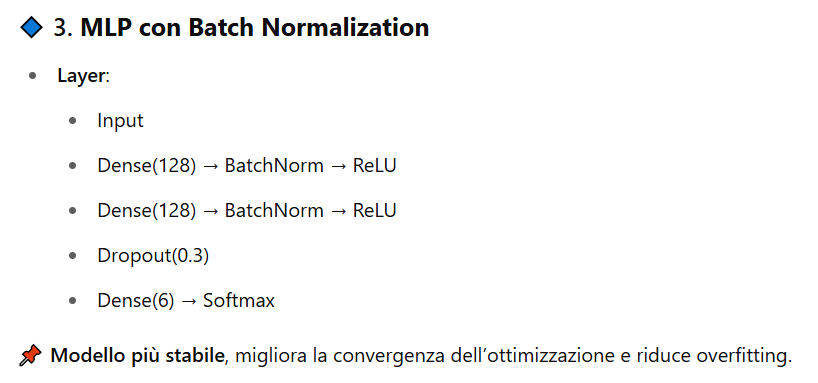

In [28]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class MLPWithBatchNorm(nn.Module):
    def __init__(self, input_size, num_classes):
        super(MLPWithBatchNorm, self).__init__()

        self.fc1 = nn.Linear(input_size, 256)
        self.bn1 = nn.BatchNorm1d(256)

        self.fc2 = nn.Linear(256, 128)
        self.bn2 = nn.BatchNorm1d(128)

        self.fc3 = nn.Linear(128, 64)
        self.bn3 = nn.BatchNorm1d(64)

        self.output_layer = nn.Linear(64, num_classes)

    def forward(self, x):
        x = F.relu(self.bn1(self.fc1(x)))
        x = F.relu(self.bn2(self.fc2(x)))
        x = F.relu(self.bn3(self.fc3(x)))
        x = self.output_layer(x)
        return x
    
# Esempio d'uso
model = MLPWithBatchNorm(21, 6)

# Loss e ottimizzatore
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Visualizzazione struttura
print(model)

MLPWithBatchNorm(
  (fc1): Linear(in_features=21, out_features=256, bias=True)
  (bn1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc3): Linear(in_features=128, out_features=64, bias=True)
  (bn3): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (output_layer): Linear(in_features=64, out_features=6, bias=True)
)


In [29]:
# ignite trainer
trainer = create_supervised_trainer(model, optimizer, criterion)

# validation metrics are ignite metrics
val_metrics = {"accuracy": Accuracy(), "loss": Loss(criterion)}

# ignite train and validation evaluators
train_evaluator = create_supervised_evaluator(model, metrics=val_metrics)
val_evaluator = create_supervised_evaluator(model, metrics=val_metrics)


training_history = {'accuracy':[],'loss':[]}
validation_history = {'accuracy':[],'loss':[]}

In [30]:
log_interval = 100

@trainer.on(Events.ITERATION_COMPLETED(every=log_interval))
def log_training_loss(engine):
    print(f"Epoch[{engine.state.epoch}], Iter[{engine.state.iteration}] Loss: {engine.state.output:.2f}")

@val_evaluator.on(Events.ITERATION_COMPLETED)
def debug_output_target(engine):
    output, target = engine.state.output
    print("OUTPUT SHAPE:", output.shape)   # Formato atteso: [batch_size, 6]
    print("TARGET SHAPE:", target.shape)   # Formato atteso: [batch_size]
    print("TARGET DTYPE:", target.dtype)   # Dovrebbe essere torch.int64 (long)

# after a training epoch, computes training and validation metrics (train_eval on train_loader and val_eval on val_loader)
@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(trainer):
    train_evaluator.run(train_loader)
    metrics = train_evaluator.state.metrics
    training_history['accuracy'].append(metrics['accuracy']*100)
    training_history['loss'].append(metrics['loss'])
    print(f"Training Results - Epoch[{trainer.state.epoch}] Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['loss']:.2f}")

@trainer.on(Events.EPOCH_COMPLETED)
def log_validation_results(trainer):
    val_evaluator.run(val_loader)
    metrics = val_evaluator.state.metrics
    validation_history['accuracy'].append(metrics['accuracy']*100)
    validation_history['loss'].append(metrics['loss'])
    print(f"Validation Results - Epoch[{trainer.state.epoch}] Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['loss']:.2f}")

In [31]:
from ignite.handlers import EarlyStopping, ModelCheckpoint
from ignite.contrib.handlers import global_step_from_engine

# return current value of any metric defined in val_metrics
def score_function(engine):
    return engine.state.metrics["accuracy"]

# define early stopping and model checkpoint
handler = EarlyStopping(patience=10, score_function=score_function, trainer=trainer)

checkpoint = ModelCheckpoint(
    dirname='models',
    filename_prefix='best_NOREG',
    n_saved=1,
    create_dir=True,
    global_step_transform=global_step_from_engine(trainer), # helps fetch the trainer's state
    require_empty=False
)

# Attach early stopping and model checkpoint to the trainer
val_evaluator.add_event_handler(Events.EPOCH_COMPLETED, handler)
val_evaluator.add_event_handler(Events.EPOCH_COMPLETED, checkpoint, {'model': model})

In [32]:
trainer.run(train_loader, max_epochs=30)

Epoch[1], Iter[100] Loss: 1.00
Epoch[1], Iter[200] Loss: 0.51
Epoch[1], Iter[300] Loss: 0.36
Epoch[1], Iter[400] Loss: 0.29
Epoch[1], Iter[500] Loss: 0.63
Epoch[1], Iter[600] Loss: 0.38
Epoch[1], Iter[700] Loss: 0.49
Epoch[1], Iter[800] Loss: 0.37
Epoch[1], Iter[900] Loss: 0.57
Epoch[1], Iter[1000] Loss: 0.21
Epoch[1], Iter[1100] Loss: 0.18
Epoch[1], Iter[1200] Loss: 0.34
Epoch[1], Iter[1300] Loss: 0.31
Epoch[1], Iter[1400] Loss: 0.28
Epoch[1], Iter[1500] Loss: 0.21
Epoch[1], Iter[1600] Loss: 0.22
Epoch[1], Iter[1700] Loss: 0.53
Epoch[1], Iter[1800] Loss: 0.34
Epoch[1], Iter[1900] Loss: 0.13
Epoch[1], Iter[2000] Loss: 0.13
Epoch[1], Iter[2100] Loss: 0.44
Epoch[1], Iter[2200] Loss: 0.29
Epoch[1], Iter[2300] Loss: 0.27
Epoch[1], Iter[2400] Loss: 0.54
Epoch[1], Iter[2500] Loss: 0.23
Epoch[1], Iter[2600] Loss: 0.31
Epoch[1], Iter[2700] Loss: 0.32
Epoch[1], Iter[2800] Loss: 0.50
Epoch[1], Iter[2900] Loss: 0.26
Epoch[1], Iter[3000] Loss: 0.44
Epoch[1], Iter[3100] Loss: 0.18
Epoch[1], Iter[32

2025-05-01 19:59:10,719 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64

State:
	iteration: 58536
	epoch: 18
	epoch_length: 3252
	max_epochs: 30
	output: 0.0013204376446083188
	batch: <class 'list'>
	metrics: <class 'dict'>
	dataloader: <class 'torch.utils.data.dataloader.DataLoader'>
	seed: <class 'NoneType'>
	times: <class 'dict'>

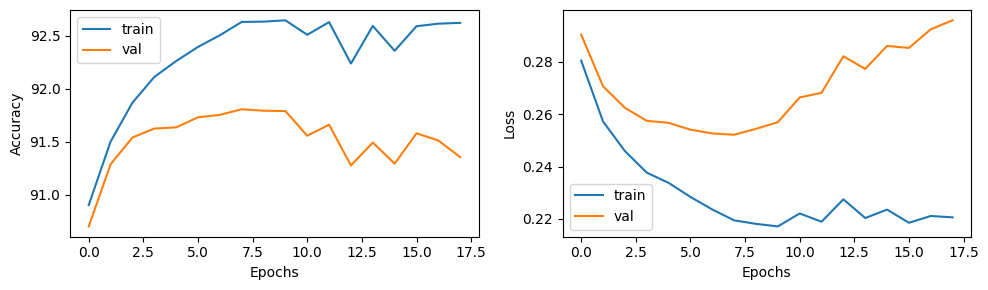

In [33]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 3))
axes[0].plot(training_history['accuracy'], label='train')
axes[0].plot(validation_history['accuracy'], label='val')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(training_history['loss'], label='train')
axes[1].plot(validation_history['loss'], label='val')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Loss')
axes[1].legend()
fig.tight_layout()

plt.show()

In [34]:
# IL NUMERO VA CAMBIATO OGNI VOLTA CHE CAMBIA IL MODELLO (in base anche alla rete neurale di riferimento)
model.load_state_dict(torch.load('models/best_NOREG_model_18.pt'))

<All keys matched successfully>

In [35]:
# Valutazione sul test set + estrazione delle predizioni
from ignite.engine import create_supervised_evaluator
from ignite.metrics import Accuracy, Loss

# Metriche su test set
test_metrics = {"accuracy": Accuracy(), "loss": Loss(criterion)}
test_evaluator = create_supervised_evaluator(model, metrics=test_metrics)

test_evaluator.run(test_loader)
metrics = test_evaluator.state.metrics
print(f"Test Results - Accuracy: {metrics['accuracy']:.4f}, Loss: {metrics['loss']:.4f}")

# Estrazione predizioni e target
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for xb, yb in test_loader:
        outputs = model(xb)
        preds = torch.argmax(outputs, dim=1)
        y_true.extend(yb.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())


Test Results - Accuracy: 0.9124, Loss: 0.2909


In [36]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc, precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import label_binarize

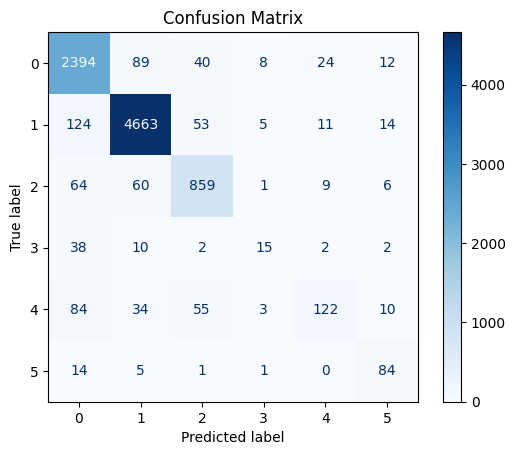

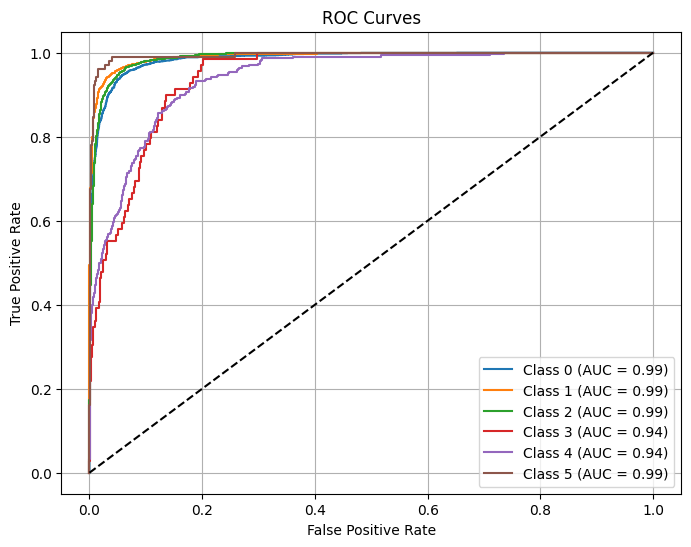

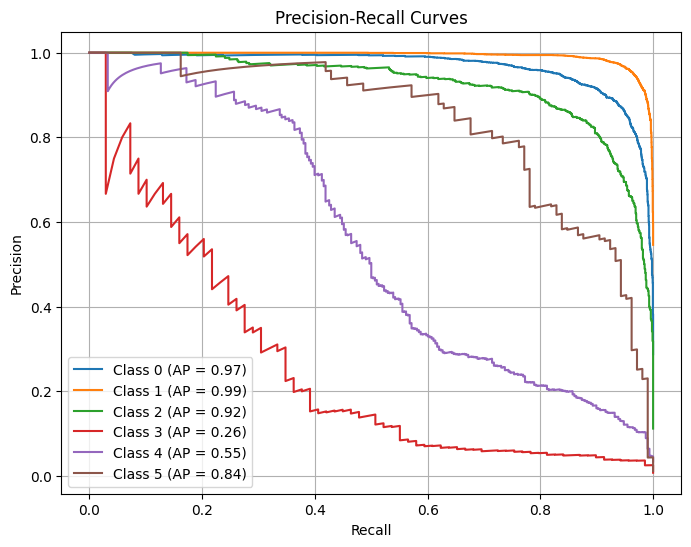

In [37]:
# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

# Binarizzazione per ROC e PR curve
n_classes = len(np.unique(y_true))
y_true_bin = label_binarize(y_true, classes=list(range(n_classes)))

# Ottieni probabilità predette
model.eval()
y_scores = []

with torch.no_grad():
    for xb, _ in test_loader:
        outputs = model(xb)
        probs = torch.softmax(outputs, dim=1)
        y_scores.extend(probs.cpu().numpy())

y_scores = np.array(y_scores)

# ROC Curve per ogni classe
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves")
plt.legend()
plt.grid(True)
plt.show()

# Precision-Recall Curve per ogni classe
precision = dict()
recall = dict()
avg_precision = dict()

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_true_bin[:, i], y_scores[:, i])
    avg_precision[i] = average_precision_score(y_true_bin[:, i], y_scores[:, i])

plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(recall[i], precision[i], label=f"Class {i} (AP = {avg_precision[i]:.2f})")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curves")
plt.legend()
plt.grid(True)
plt.show()

## Residual MLP

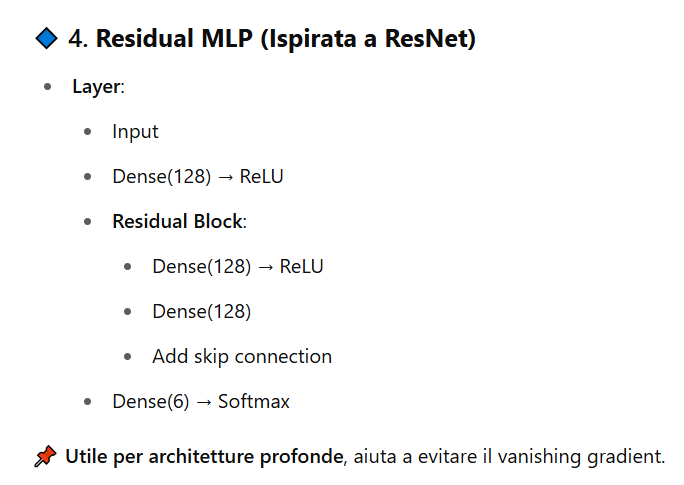

In [38]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class ResidualBlock(nn.Module):
    def __init__(self, dim):
        super(ResidualBlock, self).__init__()
        self.fc1 = nn.Linear(dim, dim)
        self.bn1 = nn.BatchNorm1d(dim)
        self.fc2 = nn.Linear(dim, dim)
        self.bn2 = nn.BatchNorm1d(dim)

    def forward(self, x):
        residual = x
        out = F.relu(self.bn1(self.fc1(x)))
        out = self.bn2(self.fc2(out))
        out += residual  # skip connection
        return F.relu(out)

class ResidualMLP(nn.Module):
    def __init__(self, input_size, num_classes):
        super(ResidualMLP, self).__init__()
        self.input_layer = nn.Linear(input_size, 128)
        self.bn_input = nn.BatchNorm1d(128)

        # Due blocchi residui
        self.res_block1 = ResidualBlock(128)
        self.res_block2 = ResidualBlock(128)

        self.output_layer = nn.Linear(128, num_classes)

    def forward(self, x):
        x = F.relu(self.bn_input(self.input_layer(x)))
        x = self.res_block1(x)
        x = self.res_block2(x)
        x = self.output_layer(x)
        return x
    
# Esempio d'uso
model = ResidualMLP(21, 6)

# Loss e ottimizzatore
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Visualizzazione struttura
print(model)


ResidualMLP(
  (input_layer): Linear(in_features=21, out_features=128, bias=True)
  (bn_input): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (res_block1): ResidualBlock(
    (fc1): Linear(in_features=128, out_features=128, bias=True)
    (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc2): Linear(in_features=128, out_features=128, bias=True)
    (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (res_block2): ResidualBlock(
    (fc1): Linear(in_features=128, out_features=128, bias=True)
    (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (fc2): Linear(in_features=128, out_features=128, bias=True)
    (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output_layer): Linear(in_features=128, out_features=6, bias=True)
)


In [39]:
# ignite trainer
trainer = create_supervised_trainer(model, optimizer, criterion)

# validation metrics are ignite metrics
val_metrics = {"accuracy": Accuracy(), "loss": Loss(criterion)}

# ignite train and validation evaluators
train_evaluator = create_supervised_evaluator(model, metrics=val_metrics)
val_evaluator = create_supervised_evaluator(model, metrics=val_metrics)


training_history = {'accuracy':[],'loss':[]}
validation_history = {'accuracy':[],'loss':[]}

In [40]:
# QUESTO è DA MANDARE QUANDO SI LANCIA IL MODELLO CON TRAINV
log_interval = 100

@trainer.on(Events.ITERATION_COMPLETED(every=log_interval))
def log_training_loss(engine):
    print(f"Epoch[{engine.state.epoch}], Iter[{engine.state.iteration}] Loss: {engine.state.output:.2f}")

@val_evaluator.on(Events.ITERATION_COMPLETED)
def debug_output_target(engine):
    output, target = engine.state.output
    print("OUTPUT SHAPE:", output.shape)   # Formato atteso: [batch_size, 6]
    print("TARGET SHAPE:", target.shape)   # Formato atteso: [batch_size]
    print("TARGET DTYPE:", target.dtype)   # Dovrebbe essere torch.int64 (long)

# after a training epoch, computes training and validation metrics (train_eval on train_loader and val_eval on val_loader)
@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(trainer):
    train_evaluator.run(train_loader)
    metrics = train_evaluator.state.metrics
    training_history['accuracy'].append(metrics['accuracy']*100)
    training_history['loss'].append(metrics['loss'])
    print(f"Training Results - Epoch[{trainer.state.epoch}] Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['loss']:.2f}")

@trainer.on(Events.EPOCH_COMPLETED)
def log_validation_results(trainer):
    val_evaluator.run(val_loader)
    metrics = val_evaluator.state.metrics
    validation_history['accuracy'].append(metrics['accuracy']*100)
    validation_history['loss'].append(metrics['loss'])
    print(f"Validation Results - Epoch[{trainer.state.epoch}] Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['loss']:.2f}")

In [41]:
from ignite.handlers import EarlyStopping, ModelCheckpoint
from ignite.contrib.handlers import global_step_from_engine

# return current value of any metric defined in val_metrics
def score_function(engine):
    return engine.state.metrics["accuracy"]

# define early stopping and model checkpoint
handler = EarlyStopping(patience=10, score_function=score_function, trainer=trainer)

checkpoint = ModelCheckpoint(
    dirname='models',
    filename_prefix='best_NOREG',
    n_saved=1,
    create_dir=True,
    global_step_transform=global_step_from_engine(trainer), # helps fetch the trainer's state
    require_empty=False
)

# Attach early stopping and model checkpoint to the trainer
val_evaluator.add_event_handler(Events.EPOCH_COMPLETED, handler)
val_evaluator.add_event_handler(Events.EPOCH_COMPLETED, checkpoint, {'model': model})

In [42]:
trainer.run(train_loader, max_epochs=30)

Epoch[1], Iter[100] Loss: 1.05
Epoch[1], Iter[200] Loss: 0.48
Epoch[1], Iter[300] Loss: 0.33
Epoch[1], Iter[400] Loss: 0.26
Epoch[1], Iter[500] Loss: 0.73
Epoch[1], Iter[600] Loss: 0.33
Epoch[1], Iter[700] Loss: 0.46
Epoch[1], Iter[800] Loss: 0.38
Epoch[1], Iter[900] Loss: 0.52
Epoch[1], Iter[1000] Loss: 0.25
Epoch[1], Iter[1100] Loss: 0.20
Epoch[1], Iter[1200] Loss: 0.42
Epoch[1], Iter[1300] Loss: 0.34
Epoch[1], Iter[1400] Loss: 0.29
Epoch[1], Iter[1500] Loss: 0.23
Epoch[1], Iter[1600] Loss: 0.25
Epoch[1], Iter[1700] Loss: 0.60
Epoch[1], Iter[1800] Loss: 0.31
Epoch[1], Iter[1900] Loss: 0.16
Epoch[1], Iter[2000] Loss: 0.13
Epoch[1], Iter[2100] Loss: 0.41
Epoch[1], Iter[2200] Loss: 0.37
Epoch[1], Iter[2300] Loss: 0.25
Epoch[1], Iter[2400] Loss: 0.54
Epoch[1], Iter[2500] Loss: 0.26
Epoch[1], Iter[2600] Loss: 0.38
Epoch[1], Iter[2700] Loss: 0.31
Epoch[1], Iter[2800] Loss: 0.58
Epoch[1], Iter[2900] Loss: 0.26
Epoch[1], Iter[3000] Loss: 0.46
Epoch[1], Iter[3100] Loss: 0.18
Epoch[1], Iter[32

2025-05-01 20:11:31,765 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64
OUTPUT SHAPE: torch.Size([32, 6])
TARGET SHAPE: torch.Size([32])
TARGET DTYPE: torch.int64

State:
	iteration: 71544
	epoch: 22
	epoch_length: 3252
	max_epochs: 30
	output: 0.00032483815448358655
	batch: <class 'list'>
	metrics: <class 'dict'>
	dataloader: <class 'torch.utils.data.dataloader.DataLoader'>
	seed: <class 'NoneType'>
	times: <class 'dict'>

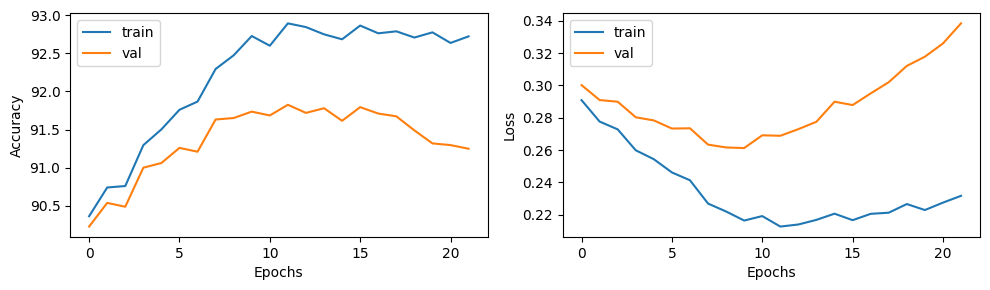

In [43]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 3))
axes[0].plot(training_history['accuracy'], label='train')
axes[0].plot(validation_history['accuracy'], label='val')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(training_history['loss'], label='train')
axes[1].plot(validation_history['loss'], label='val')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Loss')
axes[1].legend()
fig.tight_layout()

plt.show()

In [44]:
# IL NUMERO VA CAMBIATO OGNI VOLTA CHE CAMBIA IL MODELLO (in base anche alla rete neurale di riferimento)
model.load_state_dict(torch.load('models/best_NOREG_model_22.pt'))

<All keys matched successfully>

In [45]:
# Valutazione sul test set + estrazione delle predizioni
from ignite.engine import create_supervised_evaluator
from ignite.metrics import Accuracy, Loss

# Metriche su test set
test_metrics = {"accuracy": Accuracy(), "loss": Loss(criterion)}
test_evaluator = create_supervised_evaluator(model, metrics=test_metrics)

test_evaluator.run(test_loader)
metrics = test_evaluator.state.metrics
print(f"Test Results - Accuracy: {metrics['accuracy']:.4f}, Loss: {metrics['loss']:.4f}")

# Estrazione predizioni e target
model.eval()
y_true = []
y_pred = []

with torch.no_grad():
    for xb, yb in test_loader:
        outputs = model(xb)
        preds = torch.argmax(outputs, dim=1)
        y_true.extend(yb.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())


Test Results - Accuracy: 0.9091, Loss: 0.3479


In [46]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc, precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import label_binarize

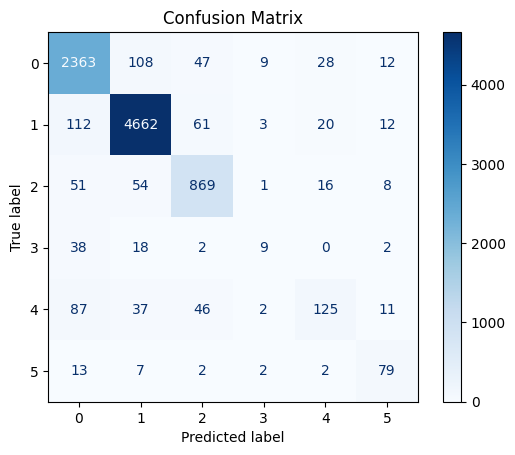

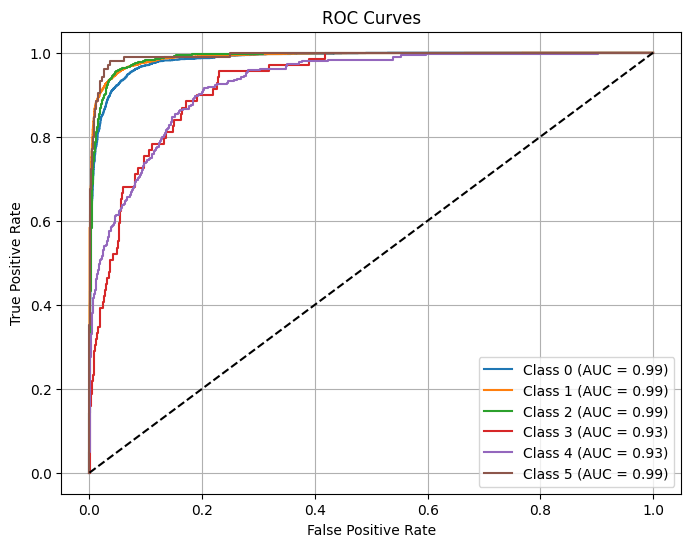

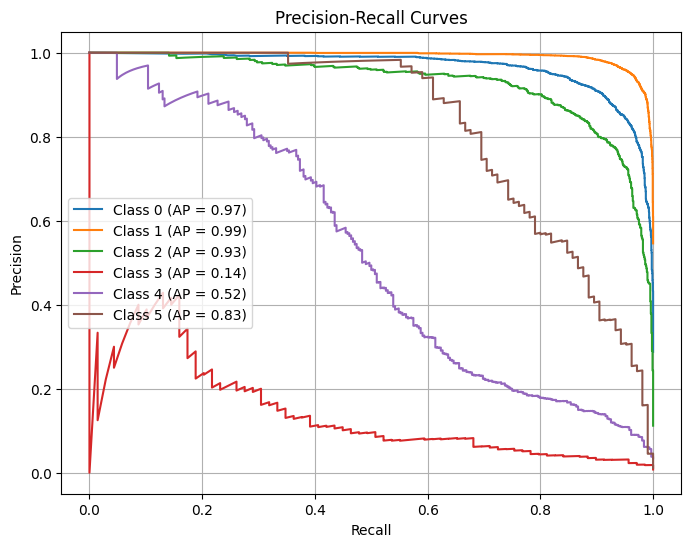

In [47]:
# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

# Binarizzazione per ROC e PR curve
n_classes = len(np.unique(y_true))
y_true_bin = label_binarize(y_true, classes=list(range(n_classes)))

# Ottieni probabilità predette
model.eval()
y_scores = []

with torch.no_grad():
    for xb, _ in test_loader:
        outputs = model(xb)
        probs = torch.softmax(outputs, dim=1)
        y_scores.extend(probs.cpu().numpy())

y_scores = np.array(y_scores)

# ROC Curve per ogni classe
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves")
plt.legend()
plt.grid(True)
plt.show()

# Precision-Recall Curve per ogni classe
precision = dict()
recall = dict()
avg_precision = dict()

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_true_bin[:, i], y_scores[:, i])
    avg_precision[i] = average_precision_score(y_true_bin[:, i], y_scores[:, i])

plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(recall[i], precision[i], label=f"Class {i} (AP = {avg_precision[i]:.2f})")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curves")
plt.legend()
plt.grid(True)
plt.show()